# Multi-reflection BCDI: reconstruction notebook
## Compact crystal with smoothly varying phase (no dislocations)

In [ ]:
import sys

sys.path.insert( 0, '../src' )

In [1]:
import numpy as np
import h5py as h5

import torch

from logzero import logger
import matplotlib.pyplot as plt
import TilePlot as tp
from torch.fft import fftshift as fftshift_t, fftn as fftn_t
from numpy.fft import fftshift as fftshift_o, fftn as fftn_o

# from MultiReflectionSolver import MultiReflectionSolver
import MultiReflectionSolver.MultiReflectionSolver as mrbcdi

In [2]:
# %matplotlib notebook
%matplotlib inline

In [3]:
datafile = '../data/Au_Nodisloc.h5'
resultfile = '../reconstructions/Results_nodisloc.h5'

In [4]:
optim_plan = { 
    'minibatches': [ 400, 320, 240, 160, 80, 40, 20, 1 ], 
    'minibatch_size': [ 2, 3, 3, 3, 3, 4, 4, 5 ],
    'iterations_per_minibatch': [ 6, 12, 25, 50, 100, 200, 400, 2000 ]
}

In [5]:
logger.info( 'Loading grain data into solver. ' )
# with h5.File( datafile, 'r' ) as data:
data = h5.File( datafile, 'r' )
logger.info( 'Printing data tree...' )
data.visit( print )

[I 220514 00:20:21 <ipython-input-5-5e2b518acea0>:1] Loading grain data into solver. 
[I 220514 00:20:21 <ipython-input-5-5e2b518acea0>:4] Printing data tree...


global
global/mask
global/ux
global/uy
global/uz
scans
scans/dataset_13
scans/dataset_18
scans/dataset_18/intensity
scans/dataset_18/object
scans/dataset_18/signal
scans/dataset_18/signal/photon_max_10000.0
scans/dataset_18/signal/photon_max_100000.0
scans/dataset_18/signal/photon_max_1000000.0
scans/dataset_18/wave
scans/dataset_20
scans/dataset_20/intensity
scans/dataset_20/object
scans/dataset_20/signal
scans/dataset_20/signal/photon_max_10000.0
scans/dataset_20/signal/photon_max_100000.0
scans/dataset_20/signal/photon_max_1000000.0
scans/dataset_20/wave
scans/dataset_23
scans/dataset_23/intensity
scans/dataset_23/object
scans/dataset_23/signal
scans/dataset_23/signal/photon_max_10000.0
scans/dataset_23/signal/photon_max_100000.0
scans/dataset_23/signal/photon_max_1000000.0
scans/dataset_23/wave
scans/dataset_4
scans/dataset_4/intensity
scans/dataset_4/object
scans/dataset_4/signal
scans/dataset_4/signal/photon_max_10000.0
scans/dataset_4/signal/photon_max_100000.0
scans/dataset_4/s

In [6]:
data[ 'scans' ].attrs.keys()

<KeysViewHDF5 ['successful_scans']>

In [7]:
solver = mrbcdi.MultiReflectionSolver( 
    database=data, 
    signal_label='signal/photon_max_100000.0', 
    sigma=2.85, 
    learning_rate=5.e-3,
    activation_parameter=1., 
    minibatch_plan=optim_plan, 
    lambda_tv=1.e-5
) # default median filter kernel size = 3
logger.info( 'Created solver. ' )
logger.info( 'Successful scans: %s'%str( data[ 'scans' ].attrs[ 'successful_scans' ] ) )
    
logger.info( 'Global parameters: ' )
for key, value in solver.globals.items():
    logger.info( '\t%s: %s'%( key, value ) )

[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:11] Created solver. 
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:12] Successful scans: [ 4  7 18 20 23]
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:14] Global parameters: 
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:16] 	Rcryst: [[-0.45774041  0.84625239  0.27263641]
     [-0.35603789  0.10651386 -0.92838129]
     [-0.81468444 -0.52202652  0.25254221]]
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:16] 	arm: 0.638
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:16] 	idx: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 16 17 18 19 20 21 23 24 25]
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:16] 	lam: 1.3785e-11
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:16] 	lattice_parms: [ 4.078  4.078  4.078 90.    90.    90.   ]
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:16] 	pix: 5.5e-05
[I 220514 00:20:27 <ipython-input-7-afcb4c5f9cde>:16] 	step_cubic: 12.318366645816917


In [8]:
logger.info( 'Running optimizer...' )
solver.run()

[I 220514 00:20:27 <ipython-input-8-91b907a542b2>:1] Running optimizer...


Epoch          :   0%|          | 0/8 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/6 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/320 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/12 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/240 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/25 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/50 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/80 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/100 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/40 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/200 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/20 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/400 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/1 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/2000 [00:00<?, ?it/s]

In [9]:
solver.centerObject()

In [10]:
# amp = solver.__amp__.reshape( 46, 46, 46 ).detach().cpu()
amp = solver.__amp__.reshape( 
    *( solver.cubeSize for n in range( 3 ) ) 
).detach().cpu()
u_recon = solver.__u__.detach().cpu()

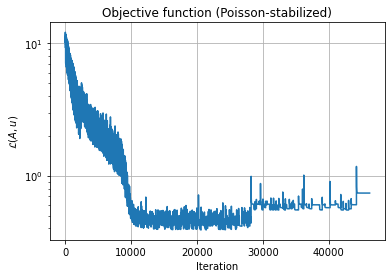

In [11]:
fig = plt.figure()
plt.semilogy( solver.error )
plt.xlabel( 'Iteration' )
plt.ylabel( '$\mathcal{L}(A, u)$')
plt.grid()
plt.title( 'Objective function (Poisson-stabilized)')
fig.canvas.draw()

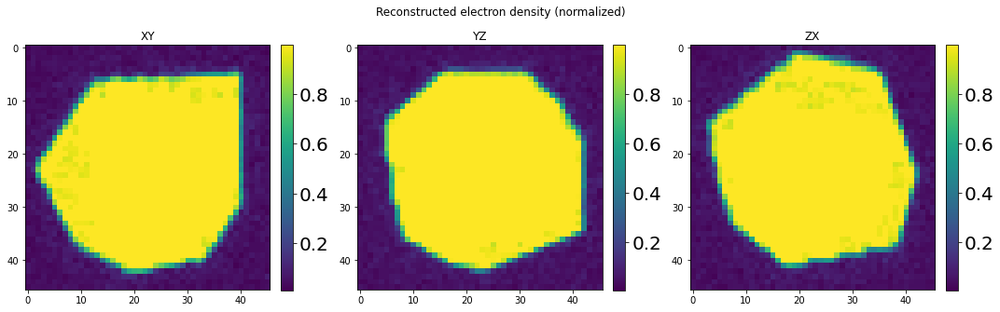

In [12]:
fig, im, ax = tp.TilePlot( 
    tuple( np.transpose( amp, np.roll( [ 0, 1, 2 ], n ) )[:,:,23] for n in range( 3 ) ), 
    ( 1, 3 ), 
    ( 15, 5 )
)
fig.suptitle( 'Reconstructed electron density (normalized)' )
for n, st in enumerate( [ 'XY', 'YZ', 'ZX' ] ):
    ax[n].set_title( st )
fig.canvas.draw()

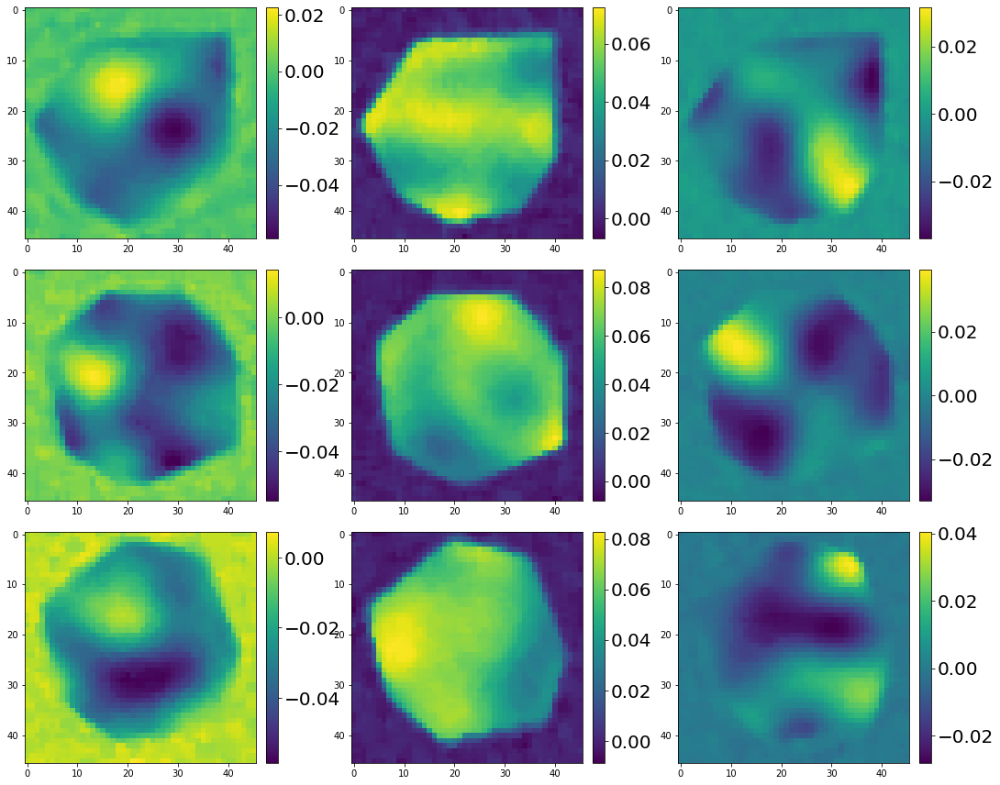

In [13]:
fig, im, ax = tp.TilePlot( 
    tuple( 
        np.transpose( arr.reshape( 46, 46, 46 ), np.roll( [ 0, 1, 2 ], n ) )[:,:,23] 
        for n in range( 3 )
        for arr in u_recon
    ), 
    ( 3, 3 ), 
    ( 15, 12 )
)
fig.canvas.draw()

In [14]:
# my_x = solver.x.detach().cpu().numpy()
# with torch.no_grad():
#     solver.x.copy_( torch.from_numpy( my_x ).cuda() )

In [15]:
new_plan = { 
    'minibatches': [ 1 ], 
    'minibatch_size': [ 5 ],
    'iterations_per_minibatch': [ 1000 ]
}
solver.setUpRestrictedOptimization( new_plan=new_plan, amp_threshold=0.2, learning_rate=1.e-3 )

In [16]:
logger.info( 'Running optimizer...' )
solver.run()

[I 220514 04:46:22 <ipython-input-16-91b907a542b2>:1] Running optimizer...


Epoch          :   0%|          | 0/1 [00:00<?, ?it/s]

Batch/minibatch:   0%|          | 0/1 [00:00<?, ?it/s]

Iteration      :   0%|          | 0/1000 [00:00<?, ?it/s]

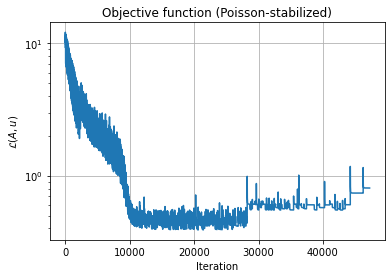

In [17]:
fig = plt.figure()
plt.semilogy( solver.error )
plt.xlabel( 'Iteration' )
plt.ylabel( '$\mathcal{L}(A, u)$')
plt.grid()
plt.title( 'Objective function (Poisson-stabilized)')
fig.canvas.draw()

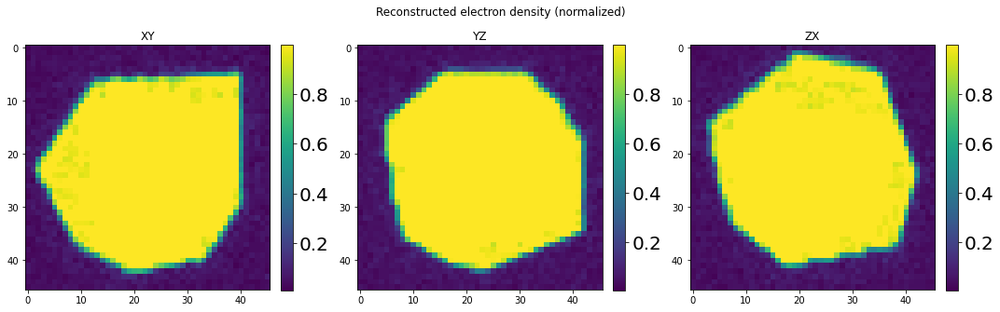

In [18]:
fig, im, ax = tp.TilePlot( 
    tuple( np.transpose( amp, np.roll( [ 0, 1, 2 ], n ) )[:,:,23] for n in range( 3 ) ), 
    ( 1, 3 ), 
    ( 15, 5 )
)
fig.suptitle( 'Reconstructed electron density (normalized)' )
for n, st in enumerate( [ 'XY', 'YZ', 'ZX' ] ):
    ax[n].set_title( st )
fig.canvas.draw()

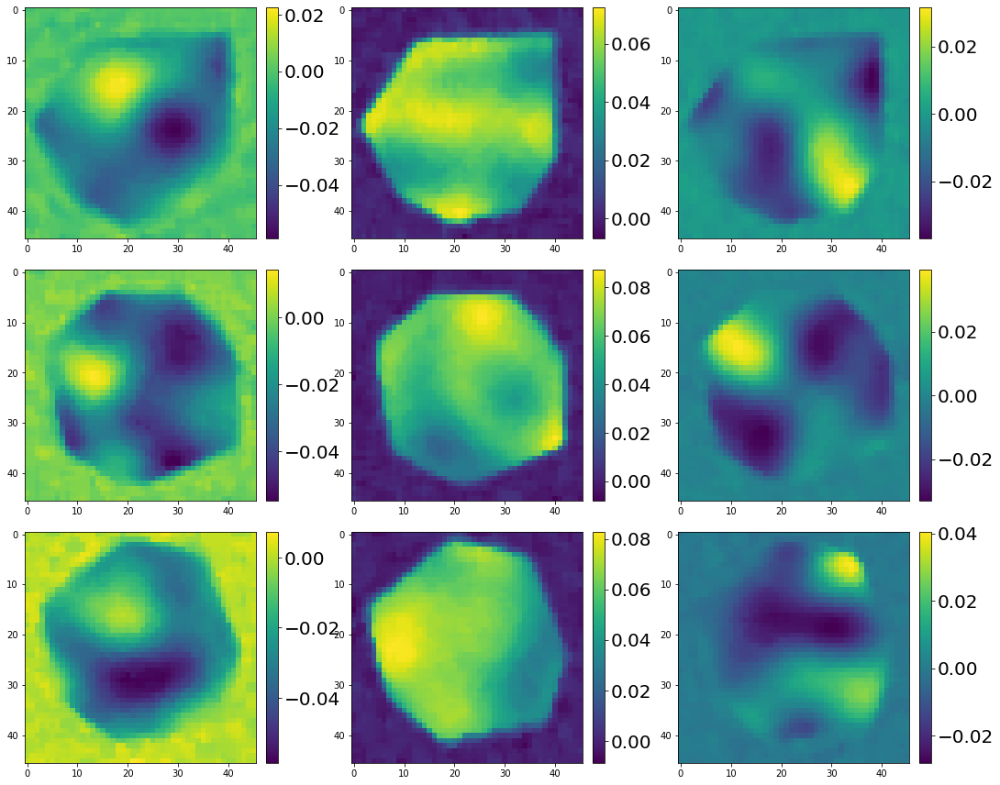

In [19]:
fig, im, ax = tp.TilePlot( 
    tuple( 
        np.transpose( arr.reshape( 46, 46, 46 ), np.roll( [ 0, 1, 2 ], n ) )[:,:,23] 
        for n in range( 3 )
        for arr in u_recon
    ), 
    ( 3, 3 ), 
    ( 15, 12 )
)
fig.canvas.draw()

In [20]:
data.close()

# Results dump
Accessible in HDF5 file named `Results_nodisloc.h5`. 

In [21]:
res = h5.File( resultfile, 'w' )

In [22]:
res.create_group( 'real_space' )
res[ 'real_space' ].create_dataset( 'electron_density', data=amp )
res[ 'real_space' ].create_dataset( 'lattice_deformation', data=u_recon )
res[ 'real_space' ].attrs[ 'scale' ] = list( 
    solver.x[-len(solver.bragg_condition):].detach().cpu().numpy() 
)

In [23]:
res.create_dataset( 'reconstruction_error', data=solver.error )

<HDF5 dataset "reconstruction_error": shape (47240,), type "<f8">

In [24]:
res.create_group( 'reciprocal_space' )
res[ 'reciprocal_space' ].attrs[ 'scan_names' ] = solver.scan_list
for n, scan in enumerate( [ st.replace( 'scans/', '' ) for st in solver.scan_list ] ):
    print( n, scan )
    obj = solver.getObjectInMount( n )
    fobj = fftshift_t( fftn_t( obj ) ).detach().cpu().numpy()
    data = fftshift_o( solver.bragg_condition[n][ 'data' ].detach().cpu().numpy() )**2
    res[ 'reciprocal_space' ].create_group( scan )
    res[ 'reciprocal_space/%s'%scan ].create_dataset( 'wave', data=fobj )
    res[ 'reciprocal_space/%s'%scan ].create_dataset( 'data', data=data )
    

0 dataset_4
1 dataset_7
2 dataset_18
3 dataset_20
4 dataset_23


In [25]:
res.close()